# **HeartView Pipeline**
## ECG Signal Quality Assessment

This notebook presents an example of the HeartView pipeline's functionalities on some sample ECG data.

### 1. Import Modules

In [1]:
from sys import path
path.append('../')
from heartview import default
from heartview.pipeline import ECG, SQA
import pandas as pd
import matplotlib.pyplot as plt

### 2. Load Data

In [2]:
file = 'sample_ecg.csv'
data = pd.read_csv(file)
data.head()

,Timestamp,mV
0,2016-10-14 10:10:51.000000,-0.206620
1,2016-10-14 10:10:51.000977,-0.197554
2,2016-10-14 10:10:51.001953,-0.186148
3,2016-10-14 10:10:51.002930,-0.197847
4,2016-10-14 10:10:51.003906,-0.190243


### 3. Setup Data

Set the parameters of your data, such as the sampling rate `fs` (Hz) and segment size `seg_size` (seconds).

In [3]:
fs = 1024
seg_size = 60

Segment your data into 60-second windows.

In [4]:
data = default.segment_data(data, fs, seg_size)
data

,Segment,Timestamp,mV
0,1,2016-10-14 10:10:51.000000,-0.206620
1,1,2016-10-14 10:10:51.000977,-0.197554
2,1,2016-10-14 10:10:51.001953,-0.186148
3,1,2016-10-14 10:10:51.002930,-0.197847
4,1,2016-10-14 10:10:51.003906,-0.190243
...,...,...,...
381948,7,2016-10-14 10:17:03.996094,-0.328868
381949,7,2016-10-14 10:17:03.997070,-0.328283
381950,7,2016-10-14 10:17:03.998047,-0.327991
381951,7,2016-10-14 10:17:03.999023,-0.303717


### 4. Filter Data

Filter out any 60-Hz powerline interference, baseline wander, and muscle noise.

In [5]:
data['Powerline'] = ECG.powerline_int_filter(data['mV'], fs, q = 20, freq = 60)
data['Filtered'] = ECG.baseline_muscle_filter(data['Powerline'], 0.5, 45, fs, order = 4)
data.head()

,Segment,Timestamp,mV,Powerline,Filtered
0,1,2016-10-14 10:10:51.000000,-0.206620,-0.205123,-0.052997
1,1,2016-10-14 10:10:51.000977,-0.197554,-0.196108,-0.048060
2,1,2016-10-14 10:10:51.001953,-0.186148,-0.184952,-0.043212
3,1,2016-10-14 10:10:51.002930,-0.197847,-0.197073,-0.038543
4,1,2016-10-14 10:10:51.003906,-0.190243,-0.190011,-0.034127


### 5. Assess Signal Quality

##### First, detect the number of peaks (i.e., heartbeats) in each segment of the signal. Save each peak occurrence in a `Peak` column in the data frame.

In [6]:
peak_ix = ECG.detect_rpeaks(data, 'Filtered', fs)
data.loc[peak_ix, 'Peak'] = 1
data.head()

,Segment,Timestamp,mV,Powerline,Filtered,Peak
0,1,2016-10-14 10:10:51.000000,-0.206620,-0.205123,-0.052997,NaN
1,1,2016-10-14 10:10:51.000977,-0.197554,-0.196108,-0.048060,NaN
2,1,2016-10-14 10:10:51.001953,-0.186148,-0.184952,-0.043212,NaN
3,1,2016-10-14 10:10:51.002930,-0.197847,-0.197073,-0.038543,NaN
4,1,2016-10-14 10:10:51.003906,-0.190243,-0.190011,-0.034127,NaN


We can quickly verify that peaks have been detected.

In [7]:
data['Peak'].sum()

807.0

##### Compute second-by-second mean heart rate (HR) and interbeat interval (IBI) values and label all invalid values.

In [8]:
interval_data = ECG.get_seconds(data, 'Peak', fs, seg_size)
interval_data

,Segment,Second,Timestamp,Mean HR,Mean IBI,# R Peaks,Invalid
0,1,1,2016-10-14 10:10:51.000000,136.939079,438.151042,2.0,0
1,1,2,2016-10-14 10:10:52.000000,135.231108,443.684896,2.0,0
2,1,3,2016-10-14 10:10:53.000000,132.058033,454.345703,2.0,0
3,1,4,2016-10-14 10:10:54.000000,132.200108,453.857422,3.0,0
4,1,5,2016-10-14 10:10:55.000000,133.468501,449.544271,2.0,0
...,...,...,...,...,...,...,...
369,7,370,2016-10-14 10:17:00.000000,130.792975,458.740234,3.0,0
370,7,371,2016-10-14 10:17:01.000000,128.715084,466.145833,2.0,0
371,7,372,2016-10-14 10:17:02.000000,130.169492,460.937500,2.0,0
372,7,373,2016-10-14 10:17:03.000000,130.445860,459.960938,2.0,0


##### Compute the SQA metrics by segment.

In [9]:
peaks_by_seg = SQA.evaluate_peaks(interval_data, seg_size)
sqa = SQA.compute_metrics(peaks_by_seg)
sqa

,Segment,Timestamp,Detected,Expected,Invalid,Missing,% Missing
0,1,2016-10-14 10:10:51.000000,131.0,133.408152,0,2.408152,1.805101
1,2,2016-10-14 10:11:51.000000,128.0,127.369862,0,0.000000,0.000000
2,3,2016-10-14 10:12:51.000000,128.0,129.086978,0,1.086978,0.842051
3,4,2016-10-14 10:13:51.000000,130.0,128.334239,0,0.000000,0.000000
4,5,2016-10-14 10:14:51.000000,124.0,124.184217,0,0.184217,0.148341
5,6,2016-10-14 10:15:51.000000,137.0,137.181144,0,0.181144,0.132047
6,7,2016-10-14 10:16:51.000000,29.0,130.445860,1,101.445860,77.768555


## Visualize Data

##### Visualize the raw and filtered ECG signal during Segment 1.

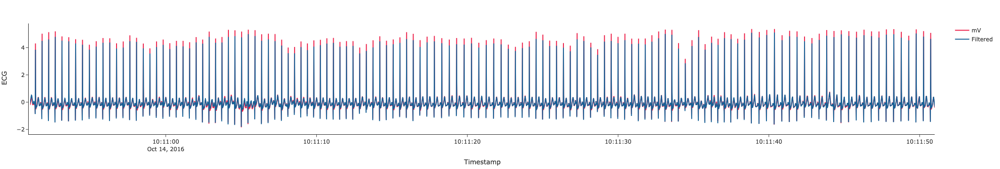

In [10]:
default.plot_signal(data, 'Timestamp', ['mV', 'Filtered'], fs, seg_size, segment = 1, signal_type = 'ecg')

##### Visualize the expected-to-missing numbers of beats per segment.

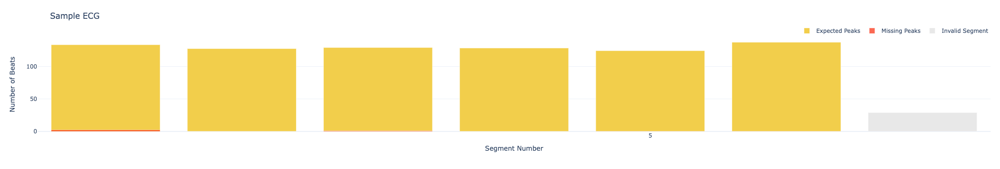

In [11]:
SQA.plot_expected2missing(sqa, title = 'Sample ECG')